In [1]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import OneHotEncoder, StandardScaler
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from catboost import CatBoostRegressor

# Load the data
dft = pd.read_csv('data/train.csv').iloc[:,1:].copy()
df = dft.iloc[:,1:].copy()

# Preprocess the data
df['BsmtFinSF'] = df['BsmtFinSF1'] + df['BsmtFinSF2']
df['BsmtFinType'] = df['BsmtFinType1'].astype(bool) | df['BsmtFinType2'].astype(bool)
df = df.drop(columns=['BsmtFinSF1', 'BsmtFinSF2', 'BsmtFinType1', 'BsmtFinType2'])

# Adding total sqfootage feature 
df['TotalSF'] = df['TotalBsmtSF'] + df['1stFlrSF'] + df['2ndFlrSF']

# Split the data into features and target
X = df.drop('SalePrice', axis=1)
y = df['SalePrice']

In [2]:
from sklearn.linear_model import ElasticNet, Lasso,  BayesianRidge, LassoLarsIC, Ridge, LinearRegression
from sklearn.ensemble import RandomForestRegressor,  GradientBoostingRegressor
from sklearn.kernel_ridge import KernelRidge
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import RobustScaler
from sklearn.base import BaseEstimator, TransformerMixin, RegressorMixin, clone
from sklearn.model_selection import KFold, cross_val_score, train_test_split
from sklearn.metrics import mean_squared_error
import xgboost as xgb
import lightgbm as lgb

# Split the data into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=49)

# Define the column transformers for numerical and categorical columns
numerical_transformer = StandardScaler(with_mean=False)
categorical_transformer = OneHotEncoder(handle_unknown='ignore')


# Identify numerical and categorical columns
numerical_cols = X.select_dtypes(include=['float64', 'int64']).columns
categorical_cols = X.select_dtypes(include=['object']).columns

# Create the preprocessing pipeline
preprocessor = ColumnTransformer(
    transformers=[
        ('num', numerical_transformer, numerical_cols),
        ('cat', categorical_transformer, categorical_cols)
    ],
    remainder='passthrough'
)

model = CatBoostRegressor()

# Create the final pipeline
pipeline = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('model', model)
])

# Fit the pipeline to the training data
pipeline.fit(X_train, y_train)

# Make predictions on the test set
y_pred = pipeline.predict(X_test)

Learning rate set to 0.04196
0:	learn: 77801.2450061	total: 159ms	remaining: 2m 39s
1:	learn: 75890.5282240	total: 166ms	remaining: 1m 22s
2:	learn: 74224.3586524	total: 172ms	remaining: 57.2s
3:	learn: 72326.8217273	total: 177ms	remaining: 44s
4:	learn: 70575.5829730	total: 181ms	remaining: 36s
5:	learn: 68946.2490859	total: 185ms	remaining: 30.6s
6:	learn: 67265.3381684	total: 187ms	remaining: 26.6s
7:	learn: 65638.4444193	total: 190ms	remaining: 23.5s
8:	learn: 64194.3266394	total: 192ms	remaining: 21.1s
9:	learn: 62684.8185808	total: 194ms	remaining: 19.2s
10:	learn: 61258.1480849	total: 196ms	remaining: 17.6s
11:	learn: 59981.4274561	total: 198ms	remaining: 16.3s
12:	learn: 58686.2695332	total: 200ms	remaining: 15.2s
13:	learn: 57333.6306066	total: 203ms	remaining: 14.3s
14:	learn: 56056.6898999	total: 204ms	remaining: 13.4s
15:	learn: 54859.4822388	total: 206ms	remaining: 12.7s
16:	learn: 53709.4149314	total: 208ms	remaining: 12.1s
17:	learn: 52605.2855446	total: 210ms	remaining:

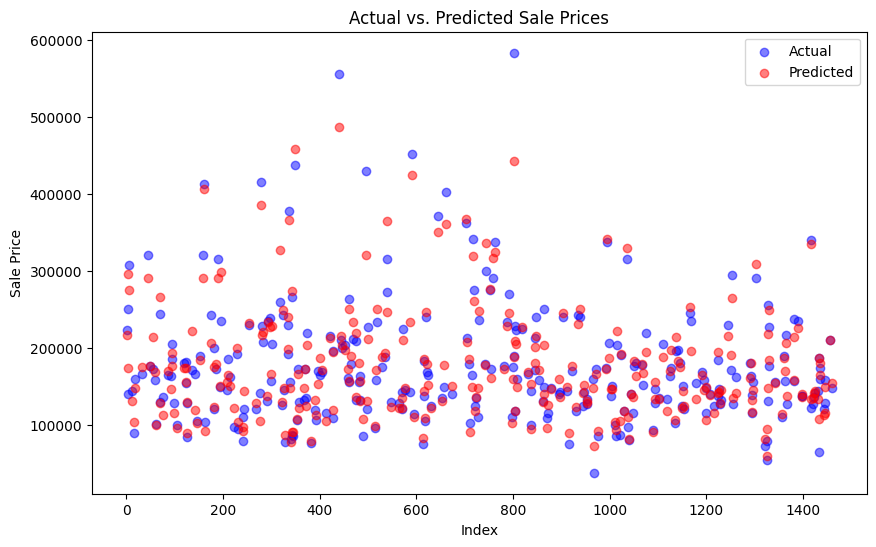

In [3]:
import pandas as pd
import matplotlib.pyplot as plt
# Create a DataFrame for plotting
plot_df = pd.DataFrame({
    'Actual': y_test,
    'Predicted': y_pred
})

# Plot the actual and predicted values
plt.figure(figsize=(10, 6))
plt.scatter(plot_df.index, plot_df['Actual'], label='Actual', color='b', alpha=0.5)
plt.scatter(plot_df.index, plot_df['Predicted'], label='Predicted', color='r', alpha=0.5)
plt.xlabel('Index')
plt.ylabel('Sale Price')
plt.title('Actual vs. Predicted Sale Prices')
plt.legend()
plt.show()

In [4]:

from sklearn.model_selection import GridSearchCV

# Define the parameter grid for CatBoostRegressor
param_grid = {
    'model__depth': [6, 8, 12],
    'model__learning_rate': [0.01, 0.05, 0.1],
    'model__l2_leaf_reg': [1, 3, 5,7]
}

# Scale the target variable
y_scaler = StandardScaler()
y_train_scaled = y_scaler.fit_transform(y_train.values.reshape(-1, 1))
y_test_scaled = y_scaler.transform(y_test.values.reshape(-1, 1))

# Perform grid search
grid_search = GridSearchCV(pipeline, param_grid=param_grid, cv=5, scoring='neg_mean_squared_error')
grid_search.fit(X_train, y_train_scaled.ravel())

# Print the best parameters and the best score
print("Best parameters: ", grid_search.best_params_)
print("Best score: ", -grid_search.best_score_)

# Make predictions on the test set using the best model
y_pred_scaled = grid_search.best_estimator_.predict(X_test)

# Inverse transform the scaled predictions and actual values
y_pred = y_scaler.inverse_transform(y_pred_scaled.reshape(-1, 1))
y_test = y_scaler.inverse_transform(y_test_scaled)

0:	learn: 1.0143036	total: 2.83ms	remaining: 2.83s
1:	learn: 1.0080215	total: 5.82ms	remaining: 2.9s
2:	learn: 1.0011438	total: 23.7ms	remaining: 7.87s
3:	learn: 0.9945329	total: 39.1ms	remaining: 9.73s
4:	learn: 0.9882842	total: 42.8ms	remaining: 8.51s
5:	learn: 0.9817242	total: 47.6ms	remaining: 7.89s
6:	learn: 0.9756362	total: 52.2ms	remaining: 7.41s
7:	learn: 0.9689398	total: 56.8ms	remaining: 7.04s
8:	learn: 0.9626708	total: 69.2ms	remaining: 7.63s
9:	learn: 0.9568086	total: 72.6ms	remaining: 7.19s
10:	learn: 0.9503640	total: 76.6ms	remaining: 6.88s
11:	learn: 0.9442982	total: 79.8ms	remaining: 6.57s
12:	learn: 0.9382200	total: 83.3ms	remaining: 6.32s
13:	learn: 0.9323321	total: 86.1ms	remaining: 6.06s
14:	learn: 0.9266876	total: 88.9ms	remaining: 5.84s
15:	learn: 0.9208121	total: 91.7ms	remaining: 5.64s
16:	learn: 0.9153308	total: 94.2ms	remaining: 5.45s
17:	learn: 0.9094698	total: 97ms	remaining: 5.29s
18:	learn: 0.9041016	total: 99.7ms	remaining: 5.15s
19:	learn: 0.8981819	tota

In [5]:
# Print the best parameters and the best score
print("Best parameters: ", grid_search.best_params_)
print("Best score: ", -grid_search.best_score_)

# Make predictions on the test set using the best model
y_pred_scaled = grid_search.best_estimator_.predict(X_test)

# Inverse transform the scaled predictions and actual values
y_pred = y_scaler.inverse_transform(y_pred_scaled.reshape(-1, 1))
y_test = y_scaler.inverse_transform(y_test_scaled)

Best parameters:  {'model__depth': 6, 'model__l2_leaf_reg': 5, 'model__learning_rate': 0.05}
Best score:  0.11186757615610143


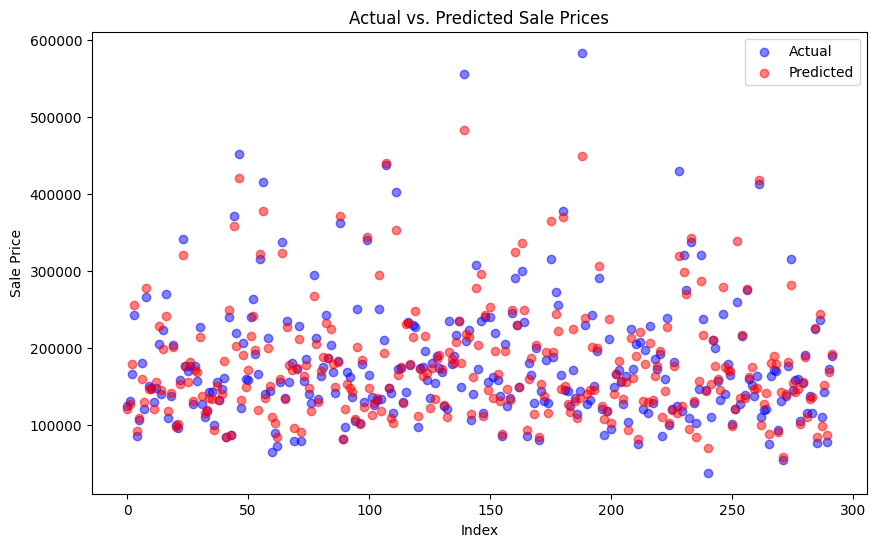

In [6]:
import pandas as pd
import matplotlib.pyplot as plt
# Make predictions on the test set using the best model


# Create a DataFrame for plotting
plot_df = pd.DataFrame({
    'Actual': y_test.flatten(),
    'Predicted': y_pred.flatten()
})
# Plot the actual and predicted values
plt.figure(figsize=(10, 6))
plt.scatter(plot_df.index, plot_df['Actual'], label='Actual', color='b', alpha=0.5)
plt.scatter(plot_df.index, plot_df['Predicted'], label='Predicted', color='r', alpha=0.5)
plt.xlabel('Index')
plt.ylabel('Sale Price')
plt.title('Actual vs. Predicted Sale Prices')
plt.legend()
plt.show()


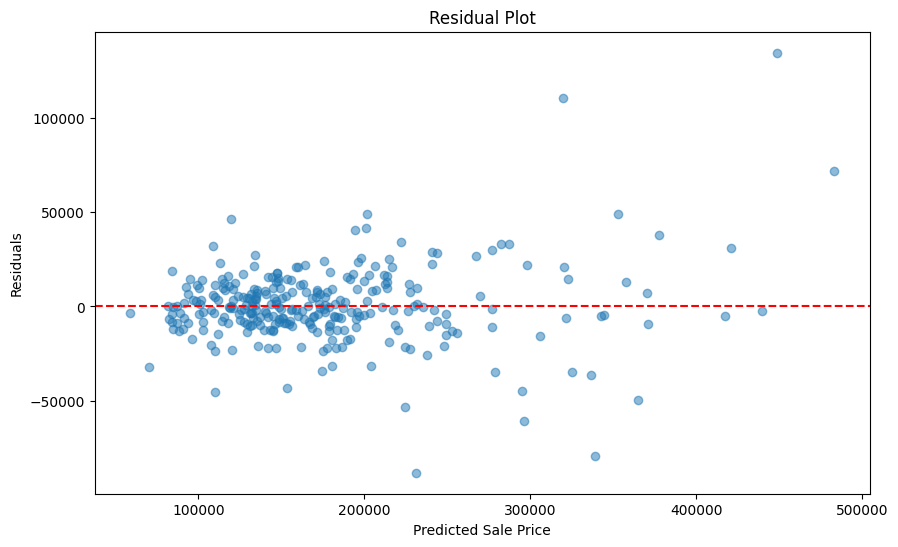

In [7]:
# Calculate residuals
residuals = y_test - y_pred

# Plot residuals
plt.figure(figsize=(10, 6))
plt.scatter(y_pred, residuals, alpha=0.5)
plt.axhline(y=0, color='r', linestyle='--')
plt.xlabel('Predicted Sale Price')
plt.ylabel('Residuals')
plt.title('Residual Plot')
plt.show()

0:	learn: 73271.4000960	total: 4.13ms	remaining: 4.12s
1:	learn: 72104.7144296	total: 7.47ms	remaining: 3.73s
2:	learn: 70855.2672553	total: 33.3ms	remaining: 11.1s
3:	learn: 69360.0845167	total: 38ms	remaining: 9.46s
4:	learn: 67863.0583555	total: 41.7ms	remaining: 8.31s
5:	learn: 66071.9106532	total: 46ms	remaining: 7.63s
6:	learn: 64556.7931859	total: 48.1ms	remaining: 6.83s
7:	learn: 62850.3990686	total: 52.3ms	remaining: 6.49s
8:	learn: 61566.5905207	total: 55ms	remaining: 6.05s
9:	learn: 60025.1163033	total: 58.2ms	remaining: 5.76s
10:	learn: 58713.1164887	total: 61.6ms	remaining: 5.53s
11:	learn: 57584.6642268	total: 64.2ms	remaining: 5.29s
12:	learn: 56692.7506616	total: 67ms	remaining: 5.09s
13:	learn: 55844.4629467	total: 69.5ms	remaining: 4.9s
14:	learn: 54618.6574486	total: 72.1ms	remaining: 4.73s
15:	learn: 53453.5487402	total: 74.5ms	remaining: 4.58s
16:	learn: 52180.7896004	total: 91.1ms	remaining: 5.27s
17:	learn: 51247.9235333	total: 93.3ms	remaining: 5.09s
18:	learn: 

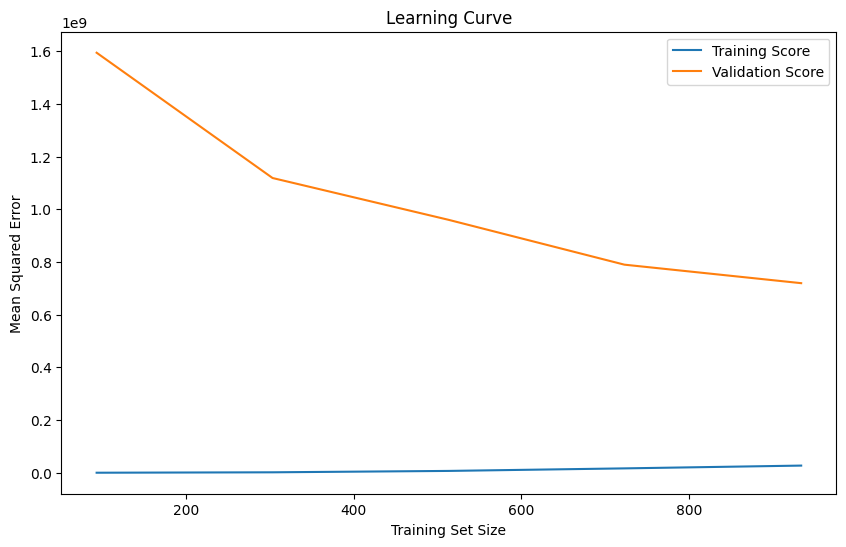

In [8]:
from sklearn.model_selection import learning_curve

train_sizes, train_scores, valid_scores = learning_curve(
    grid_search.best_estimator_, X_train, y_train, cv=5, scoring='neg_mean_squared_error')

train_scores_mean = -train_scores.mean(axis=1)
valid_scores_mean = -valid_scores.mean(axis=1)

plt.figure(figsize=(10, 6))
plt.plot(train_sizes, train_scores_mean, label='Training Score')
plt.plot(train_sizes, valid_scores_mean, label='Validation Score')
plt.xlabel('Training Set Size')
plt.ylabel('Mean Squared Error')
plt.title('Learning Curve')
plt.legend()
plt.show()

In [9]:
# Load the data
dftest = pd.read_csv('data/test.csv').iloc[:,1:].copy()

# Preprocess the data
dftest['BsmtFinSF'] = dftest['BsmtFinSF1'] + dftest['BsmtFinSF2']
dftest['BsmtFinType'] = dftest['BsmtFinType1'].astype(bool) | dftest['BsmtFinType2'].astype(bool)
dftest = dftest.drop(columns=['BsmtFinSF1', 'BsmtFinSF2', 'BsmtFinType1', 'BsmtFinType2'])

final_pred = grid_search.best_estimator_.predict(dftest)
# Load the data
dft= pd.read_csv('data/test.csv')
pd.Series(index=dft['Id'],data=final_pred).rename('SalePrice').to_csv('submission.csv')

ValueError: columns are missing: {'TotalSF'}